# Section 3.2: Vicsek Flocking with Dense Polygonal Obstacles
###### * Vicsek Flocking: The basic idea of aligning velocity with neighbors and moving toward a goal mimics flocking behavior described in the Vicsek model.


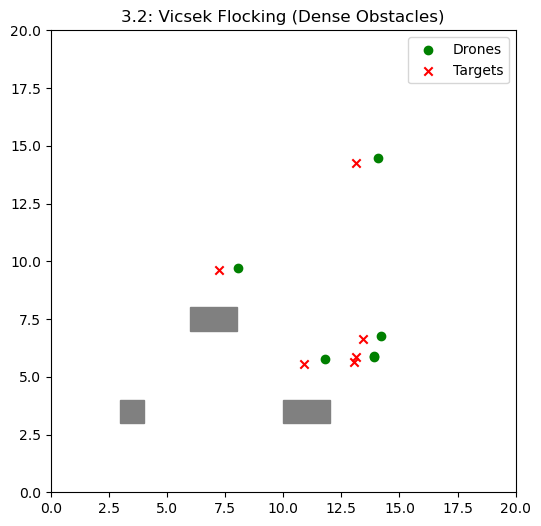

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parameters
n_drones = 6
positions = np.random.rand(n_drones, 2) * 10
velocities = np.random.rand(n_drones, 2) - 0.5
targets = np.random.rand(n_drones, 2) * 10 + 5
learning_rate = 0.1
stop_threshold = 0.1
repulsion_strength = 3.0
avoidance_radius = 2.0

# Dense polygonal obstacles
obstacles = [
    Polygon([[3,3],[4,3],[4,4],[3,4]], color='gray'),
    Polygon([[6,7],[8,7],[8,8],[6,8]], color='gray'),
    Polygon([[10,3],[12,3],[12,4],[10,4]], color='gray')
]

# Setup plot
fig, ax = plt.subplots(figsize=(6,6))
sc = ax.scatter(positions[:,0], positions[:,1], c='green', label='Drones')
target_sc = ax.scatter(targets[:,0], targets[:,1], c='red', marker='x', label='Targets')
for obs in obstacles:
    ax.add_patch(obs)
ax.set_xlim(0, 20)
ax.set_ylim(0, 20)
ax.legend()
ax.set_title('3.2: Vicsek Flocking (Dense Obstacles)')

# State controls
is_paused = False
arrived = np.array([False]*n_drones)

# Helper functions
def point_inside_obstacle(point, polygon):
    return polygon.get_path().contains_point(point)

def polygon_repulsion(drone_pos, polygon):
    centroid = np.mean(polygon.get_xy(), axis=0)
    distance = np.linalg.norm(drone_pos - centroid)
    if distance < avoidance_radius:
        return repulsion_strength * (drone_pos - centroid) / (distance**2 + 1e-6)
    return np.zeros(2)

# Update loop
def update(frame):
    global positions, velocities, arrived
    if not is_paused:
        for i in range(n_drones):
            if arrived[i]:
                continue
            avg_velocity = np.mean(velocities, axis=0)
            direction = (targets[i] - positions[i]) + avg_velocity
            norm = np.linalg.norm(direction)
            if norm < stop_threshold:
                arrived[i] = True
                continue
            direction = direction / (norm + 1e-6)

            # Apply repulsion from all obstacles
            for obs in obstacles:
                direction += polygon_repulsion(positions[i], obs)

            velocities[i] = direction
            positions[i] += learning_rate * direction
        sc.set_offsets(positions)
    return sc,

# Pause on click
def on_click(event):
    global is_paused
    if event.inaxes is not None:
        is_paused = not is_paused

fig.canvas.mpl_connect('button_press_event', on_click)

# Animate
anim = FuncAnimation(fig, update, frames=500, interval=30, blit=True)

# Display animation
HTML(anim.to_jshtml())